# SLT-CE-4: Constant Shift Embedding

## Task

Many real-world phenomena are described by pairwise proximity data, modeling interactions between the entities of the system. This in contrast to the more common situation where each data sample is given as a feature vector. Even though the clustering of the proximity data may be performed directly on the data matrix, there are some advantatages of  embedding the data into a vector space. For example, it enables the use of some standard preprocessing techniques such as denoising or dimensionality reduction. In this coding exercise, we will explore the tecnhique called _Constant Shift Embedding_ for restating pairwise clustering problems in vector spaces [1] while preserving the cluster structure. We will apply the algorithm described in [1] to cluster the groups of research community members based on the email correspondence matrix. The data and its description is given in [2].

### References 

[1] [Optimal cluster preserving embedding of nonmetric proximity data](https://ieeexplore.ieee.org/document/1251147)

[2] [email-Eu-core](https://snap.stanford.edu/data/email-Eu-core.html)

# Important:
https://stackoverflow.com/questions/26714626/how-to-disable-bbox-inches-tight-when-working-with-matplotlib-inline-in-ipytho

 <h2 style="background-color:#f0b375;"> Setup </h2>

We start by importing necessary python packages.

In [1]:
import numpy as np
import sklearn as skl
import matplotlib.pylab as plt
import pylab
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.optimize import linear_sum_assignment as l_s_a
from sklearn.metrics import confusion_matrix

import scipy.linalg as la
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

# Fix randoom seed for reproducibility
np.random.seed(42)

The number of nodes is hardcoded for simplicity (taken from [2]):

In [2]:
NUM_NODES = 1005

We load the file which contains the list of interactions between the community members (nodes). Our data matrix represents an undirected graph which connects two nodes if there was at least one email sent between the two corresponding community members. Thus our data matrix is essentially an adjacency matrix.

In [3]:
# initialize data matrix which will be an adjacency matrix
DATA = np.zeros((NUM_NODES, NUM_NODES))

# fill out the symmetric adjacency matrix
with open("email-Eu-core.txt") as file:
    for line in file:
        pair = [int(x) for x in line.split()]
        DATA[pair[0], pair[1]] = 1
        DATA[pair[1], pair[0]] = 1

Note that DATA specifies an adjacency matrix of the email graph. It's not claimed to be a proper dissimilarity matrix required by CSE algorithm. So, you are allowed to perform any manipulations to construct a suitable (dis-)similarity matrix for the further analysis.

Next we define a class which contains main functionalities - TO BE IMPLEMENTED.

In [4]:
class ConstantShiftEmbedding(skl.base.BaseEstimator, skl.base.TransformerMixin):
    """Template class for Constant Shift Embedding (CSE)
    
    Attributes:
        PMAT (np.ndarray): Proximity matrix used for calculating the embeddings.
        S (np.ndarray): Similarity matrix.
        D (np.ndarray): Dissimilarity matrix.
        
    """
    
    def __init__(self, dist_metric = "inverse"):
        self.PMAT = None
        self.S = None
        self.D = None
        self.D_metric = dist_metric
        # Add/change parameters, if necessary.
    
    def fit(self, PMAT):
        """ Calculate similarity/dissimiliarity matrix and all
        the necessary variables for calculating the embeddings.
        
        Args:
            PMAT (np.ndarray): proximity matrix
        """

        # Save data
        self.PMAT = PMAT
        self.n = PMAT.shape[0]
        
        ## IMPLEMENT THIS METHOD
        
        # As I understand the PMAT: we have an entry of the matrix PMAT_{i,j} = 1, 
        # if an E-Mail was sent between the corresponding persons. 
        # Therefore the rows and columns stand for the persons. 
        # ------------------------------------------------------------------------------------------
        
        # 1) Consutruction of the Graph. 
        # ------------------------------------------------------------------------------------------
        # give every person a connection to itself. 
        G_temp = PMAT - np.diag(np.diag(PMAT))
        G_temp = G_temp + np.diag(np.ones(PMAT.shape[0]))
        
        # 2) Dissimilarity computation
        # ------------------------------------------------------------------------------------------
        # Differnt types of dissimilarity.
        if self.D_metric == "inverse":
            space = np.zeros(G_temp.shape)
            for c_id in np.array(list(range(space.shape[1]))):
                for r_id in range(space.shape[0]):
                    c_id = int(c_id); r_id = int(r_id)
                    space[r_id,c_id] = np.sum(G_temp[r_id,:] *  G_temp[c_id,:]) + 1
            Dmat = 1/space # Dissimilarity defined as 1/sum(of all equal contacts)
            Dmat = Dmat - np.diag(np.diag(Dmat))
        
        # inspired of consine similarity of
        # https://towardsdatascience.com/17-types-of-similarity-and-dissimilarity-measures-used-in-data-science-3eb914d2681
        if self.D_metric == "cosine":
            space = np.zeros(G_temp.shape)
            for c_id in np.array(list(range(space.shape[1]))):
                for r_id in range(space.shape[0]):
                    c_id = int(c_id); r_id = int(r_id)
                    nom = np.sum(G_temp[r_id,:] *  G_temp[c_id,:]) 
                    denom = np.sqrt(np.sum(G_temp[r_id,:])) * np.sqrt(np.sum(G_temp[c_id,:]))
                    space[r_id, c_id] = nom/denom
            Dmat = 1 - space
            Dmat = Dmat - np.diag(np.diag(Dmat))
            
        
            

        # 2.1) Symmetrizing + Centering
        # ------------------------------------------------------------------------------------------
        Dmat = (1/2) * (Dmat + Dmat.T)
        Q = np.diag(np.ones(Dmat.shape[0])) - np.ones_like(Dmat)/Dmat.shape[0]
        DmatC = Q @ Dmat @ Q
        SmatC = -(1/2) * DmatC
        ## in order to plot the eigenspectrum plot
        self.SeigVa, self.SeigVc = np.linalg.eigh(SmatC)
        S2mat = SmatC - np.diag(np.tile(np.min(self.SeigVa), (1,SmatC.shape[0])).flatten())
        
        
        # 2.2) D tilde 
        # ------------------------------------------------------------------------------------------
        Sii = np.tile(np.diag(S2mat).flatten().reshape(-1, 1), (1, S2mat.shape[1]))
        Sjj = np.tile(np.diag(S2mat).flatten().reshape(1, -1), (S2mat.shape[0], 1))
        D2mat = Sii + Sjj - 2*S2mat

        # 3) output
        # ------------------------------------------------------------------------------------------
        self.D = D2mat
        self.S = SmatC # centered 
        self.Stil = S2mat # S-Tilde, used if SmatC is not positive definite.
        
        
    def get_embedded_vectors(self, p):
        """Return embeddings
        
        Args:
            p (np.ndarray): cut-off value in eigenspectrum
        
        Returns:
            Xp (np.ndarray): embedded vectors
        
        """
        
        # switch the order of the eigenvalues and vectors in descending order
        # ------------------------------------------------------------------------------------------
        Q = np.diag(np.ones(self.Stil.shape[0])) - np.ones_like(self.Stil)/self.Stil.shape[0]
        StilC = Q @ self.Stil @ Q
        values, vectors = np.linalg.eigh(StilC)
        values = np.flip(values.flatten())
        vectors = np.flip(vectors, axis = 1)
        
        # embedded vectors
        # ------------------------------------------------------------------------------------------
        values = values[:p]
        vectors = vectors[:,:p]
        # print(np.min(values)): if one uses all the vectors and eigenvalues: then there will be
        # at least 1 value which is 0: in theroy it is exactly 0, in order to handle machine precision
        # if it is negative it will not work anymore like a value as -1e-14.
        # set them to 0
        values[np.argwhere(values < 0)] = 0
        Xp = vectors @ np.sqrt(np.diag(values))
        
        # new distance matrix of the embedded ones:
        # ------------------------------------------------------------------------------------------
        Stilp = Xp @ Xp.T
        Sii = np.tile(np.diag(Stilp).flatten().reshape(-1, 1), (1, Stilp.shape[1]))
        Sjj = np.tile(np.diag(Stilp).flatten().reshape(1, -1), (Stilp.shape[0], 1))
        Dtilp = Sii + Sjj - 2*Stilp
        
        return Xp, Dtilp


<h2 style="background-color:#f0b375;">
Section 4.0 
<span style=font-size:50%> Complete all problems in this section to get a pass on this exercise. </span>
</h2>

<p style="background-color:#adebad;">Describe briefly and consicely the model given in [1]. Explain the main steps of _Constant Shift Embedding_ algorithm. See <a href="https://medium.com/ibm-data-science-experience/markdown-for-jupyter-notebooks-cheatsheet-386c05aeebed">markdown cheatsheet</a> for text editing.</p>

**Constant Shift Embedding**:

In order to motivate constant shift embeding, therer are a lot of data forms, which require carefull treatment. Data is often not available as features in a vector spaces. This makes working with this kind of data harder and precludes the use of established methodes, like PCA and SVMs. 
However, constant shif embedding reformulates proximity based data grouping with vectorial data representations. CSE allows to preserve the complete grouping structure. "The original nonmetric pairwise clustering problem can be restated as a grouping problem over points in a vector space, yielding identical assignments of objects to clusters." With the CSE priniciple, the pariwise clustering function and k-means grouping in the embedded space is equivalent. 

Given the proximity data, and a previously defined dissimiliartiy/similarity  meausure, we can compute the dissimilarity matirx $D$. Restricting D to have a diagonal 0, as the dissimilarity to itself is assumed to be zero, the data, can be embedded into a Euclidean space without influencing the cluster structure. We simmetrize $D$ by $D_{s} = \frac{1}{2}(D + D^T)$. In order to derive the centerized simillarity matrix $S^c$ from $D_s$ we calculate first the  centerized dissimilartiy matrix: $D^c = QD_sQ$, where $Q = \mathcal{I}_n - e_ne_n^T$.The centered similarity matrix is given by $S^c = -\frac{1}{2}D^c$. However, for general dissimilarity measures, $S^c$ might be indefinite. In order to make it positive semi definite, we can subtract the smallest eigenvalue from all diagonal elements. Hence $\tilde{S}$ is p.s.d., where $\tilde{S} = S^c - \lambda_{min}\mathcal{I}_n$. This leads to, that the shifted matrix has smallest eigenvalue 0. Further, we compute $\tilde{D}$, where the elements are given by $\tilde{D}_{i,j} = \tilde{S}_{i,i} +  \tilde{S}_{j,j} - 2\tilde{S}_{i,j}$. Having the offdiagonal shifted matrix $\tilde{D}$, we can use it and perform k-means clustering on it. 

In order to reconstruct the embedded vectors, we can calculate $\tilde{S}^c$ after centering $\tilde{D}$ to $\tilde{D}^c$, by $-\frac{1}{2}\tilde{D}^c$. Using the Eigenvalue decomposition on $\tilde{S}^c$ we obtain $\tilde{S}^c = V_p\Lambda_p V_p^T$. Using the obtained eigenvectors and eigenvalues it follows that: $X_p = V_p\sqrt{\Lambda_p}$, as loss free reconstruction. In order to denoise, we would not use all $p$ vectors, else we would cutoff at some $t < p$ and obtain an approximation $X_t = V_t\sqrt{\Lambda_t}$

<p style="background-color:#adebad;">
    Implement Constant Shift Embedding. We start off by making an instance of the corresponding class.
</p>    

In [5]:
CSE = ConstantShiftEmbedding(dist_metric = "cosine")

<p style="background-color:#adebad;">
    Fit the data matrix. _fit(...)_ method computes necessary variables which can be later on used to produce embeddings [1].
</p>    

In [6]:
CSE.fit(DATA)

<h2 style="background-color:#f0b375;">
Section 4.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 4.5 </span>
</h2>

<p style="background-color:#adebad;">
    Next, try to find approximately optimal $p = p^∗$, a cut-off value which removes noise from the data. To do that, produce an eigen-spectrum plot as shown in [1] figure 4a and briefly explain your choice of $p^∗$.
</p>

I have implemented several distance measures, in order to see how they behave. Firts, I simply use the inverese of "similarity count" how many instances does two persons have in common. 
Second I used the cosine distance as a further metric. Finally, I use the distnace defined as $1 - sum(same)/sum(A)+sum(B)$.

I always plot the Eigenvalues of the $S^c$ matrixs as well as the $\tilde{S}$ in order to see, if the intinal matrix is not positiv semi definite.

In [7]:
## Compute eigen-spectrum

$D_{i,j} = \frac{1}{G_i^TG_j}$, where G is the Graph:

One sees, that this measure of distance gives a quite bizzare development of eigenvalues. If one would consider it like this,  at least me, would not be sure where to cut of. Because as after 800 it starts again to decrease, therefore I will not connsider this metric further and use the two below. 

Text(0.5, 1.0, 'D: Inverse, S_tilde - Now Pos.Definite')

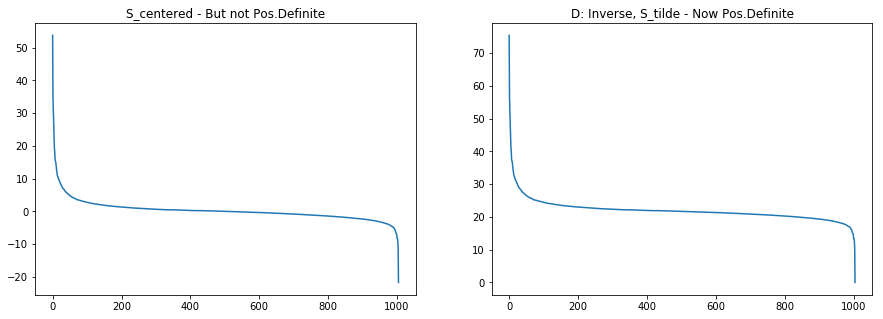

In [8]:
CSE_inverse = ConstantShiftEmbedding(dist_metric = "inverse")
CSE_inverse.fit(DATA)
va_id = np.array(list(range(CSE_inverse.SeigVa.flatten().shape[0])))

# Plotting the Eigenvalues of the centerd similarity Matrix S:
# ------------------------------------------------------------------------------------------
fig, ax = plt.subplots(1, 2, figsize = (15, 5))
ax[0].plot(np.flip(va_id), CSE_inverse.SeigVa.flatten())
ax[0].set_title("S_centered - But not Pos.Definite")
ax[1].plot(np.flip(np.linalg.eigh(CSE_inverse.Stil)[0]))
ax[1].set_title("D: Inverse, S_tilde - Now Pos.Definite")

$D_{i,j} = 1 - \frac{G_i^T G_j}{||G_i|| + ||G_j||}$

One sees a nice development of Eigenvalues. The curve decreases at the beginning very fast and flattens afterwards. I would choose the optimal p by eye and use something around a eigenvalue = 1 as the smallest. As using the more, one would include a lot of noise.

Chosen cut-off value is:  50


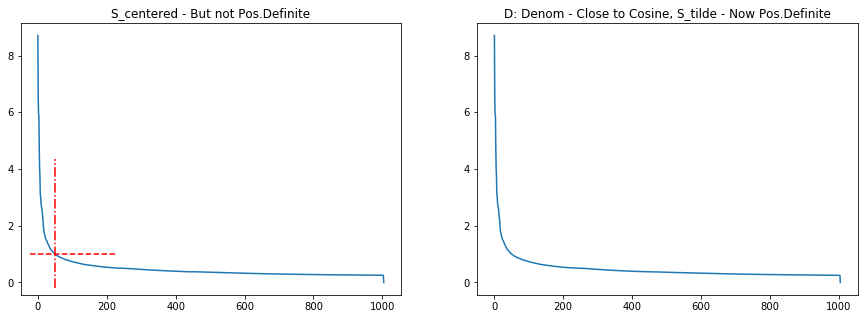

In [9]:
## Determine a good cut-off value (and write some lines to explain your choice)
## change accordingly

CSE_denom = ConstantShiftEmbedding(dist_metric = "cosine_denom")
CSE_denom.fit(DATA)
va_id = np.array(list(range(CSE_denom.SeigVa.flatten().shape[0])))

# compute the cutoff index:
p_opt_denom = np.argmax(np.flip(CSE_denom.SeigVa.flatten()) < 1) -1

# Plotting the Eigenvalues of the centerd similarity Matrix S:
# ------------------------------------------------------------------------------------------
fig, ax = plt.subplots(1, 2, figsize = (15, 5))
ax[0].plot(np.flip(va_id), CSE_denom.SeigVa.flatten())
ax[0].axhline(1, color = "red", linestyle = "--", xmin = 0.025, xmax = 0.25)
ax[0].axvline(p_opt_denom, color = "red", linestyle = "-.", ymin = 0.025, ymax = 0.5)
ax[0].set_title("S_centered - But not Pos.Definite")
ax[1].plot(np.flip(np.linalg.eigh(CSE_denom.Stil)[0]))
ax[1].set_title("D: Denom - Close to Cosine, S_tilde - Now Pos.Definite")

print("Chosen cut-off value is: ", p_opt_denom)

$D_{i,j} = 1 - \frac{G_i^T G_j}{\sqrt{||G_i||}  \sqrt{||G_j||}}$ 

Smilar here: I would again use all components with a eigenvalue larger than 1. 

Chosen cut-off value is:  56


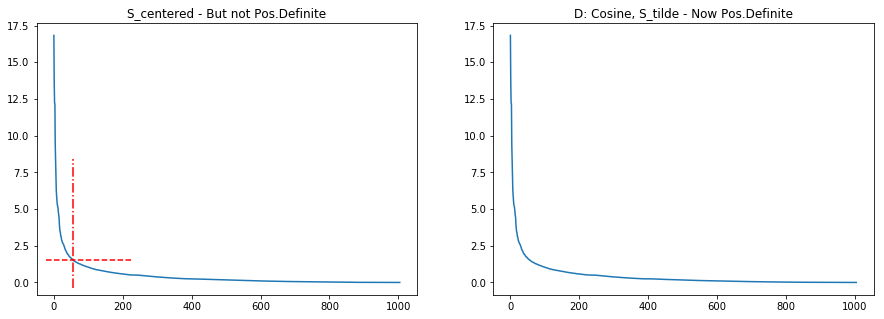

In [10]:
va_id = np.array(list(range(CSE.SeigVa.flatten().shape[0])))
p_opt = np.argmax(np.flip(CSE.SeigVa.flatten()) < 1.5) -1

# Plotting the Eigenvalues of the centerd similarity Matrix S:
# ------------------------------------------------------------------------------------------
fig, ax = plt.subplots(1, 2, figsize = (15, 5))
ax[0].plot(np.flip(va_id), CSE.SeigVa.flatten())
ax[0].axhline(1.5, color = "red", linestyle = "--", xmin = 0.025, xmax = 0.25)
ax[0].axvline(p_opt, color = "red", linestyle = "-.", ymin = 0.025, ymax = 0.5)
ax[0].set_title("S_centered - But not Pos.Definite")
ax[1].plot(np.flip(np.linalg.eigh(CSE.Stil)[0]))
ax[1].set_title("D: Cosine, S_tilde - Now Pos.Definite")


print("Chosen cut-off value is: ", p_opt)

<h2 style="background-color:#f0b375;">
Section 5.0 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5.0 </span>
</h2>

<p style="background-color:#adebad;">
    Plot the distance matrices both for the denoised ($p = p^*$ -- from the previous step) and the original versions as shown in figure 5 in [1]. Note that the distance matrix is a matrix with pairwise distances between every two points from the dataset ($d_{ij} = dist(x_i, x_j)$).<br>
    Perform K-MEANS algorithm for varying number of clusters K on the embedded vectors derrived from CSE. You may use the sklearn implementation of K-MEANS. To make the aforementioned plots meaningful, sort the nodes according to the cluster belongings for every number of clusters K (see the figure 5). For now, there is no need to include the actual ground truth labels given in [2].
</p>

In the plots below, we can see, that the $\textit{inverse} dissimilarity measure does not perform in a good way. There is a lot of noise, and almost no structure. 

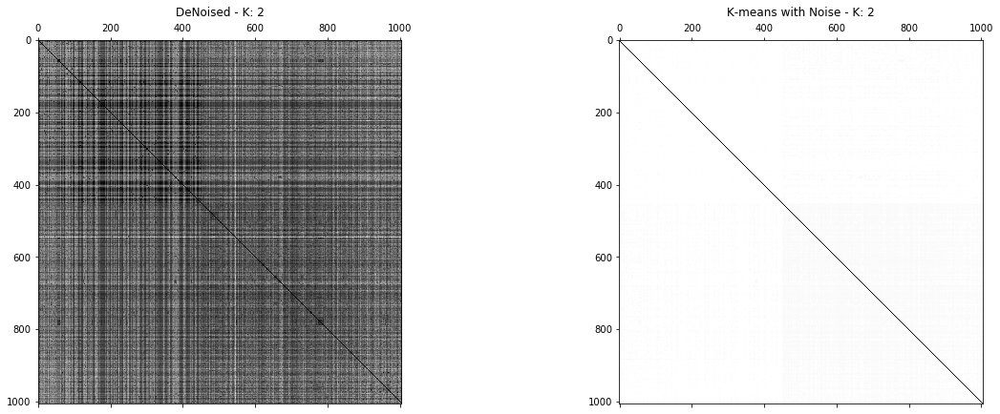

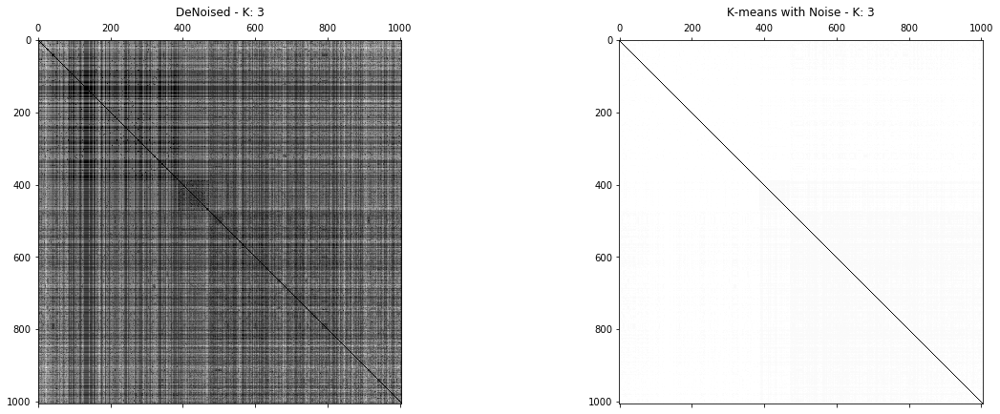

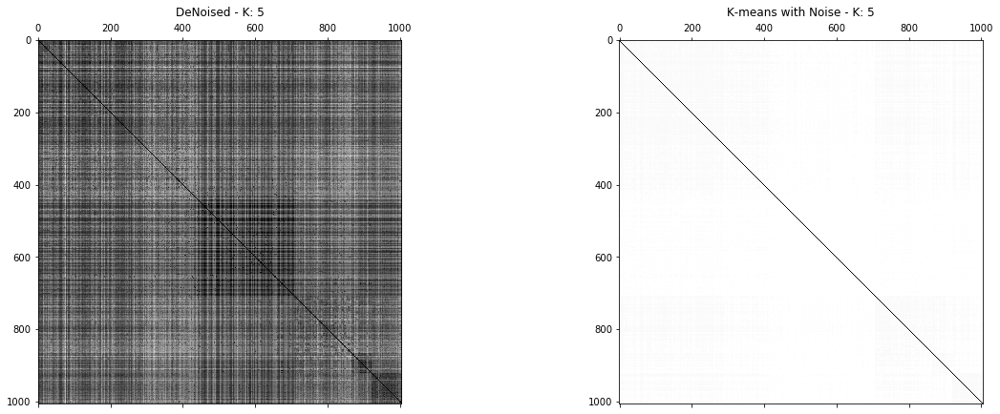

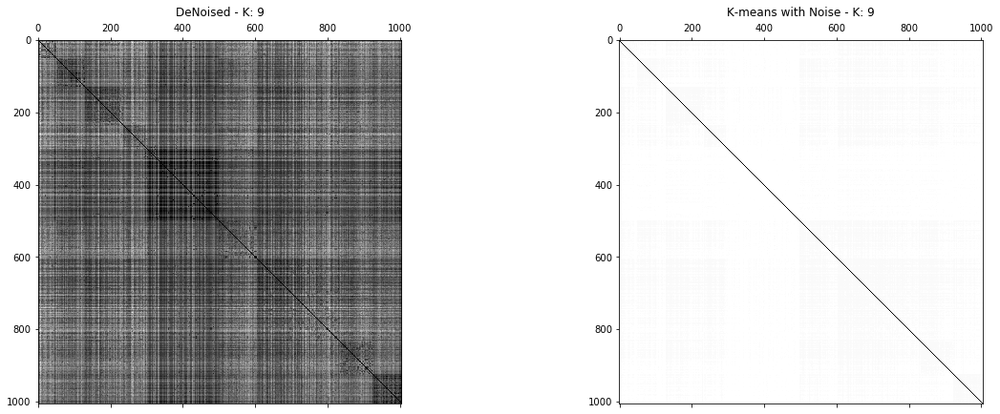

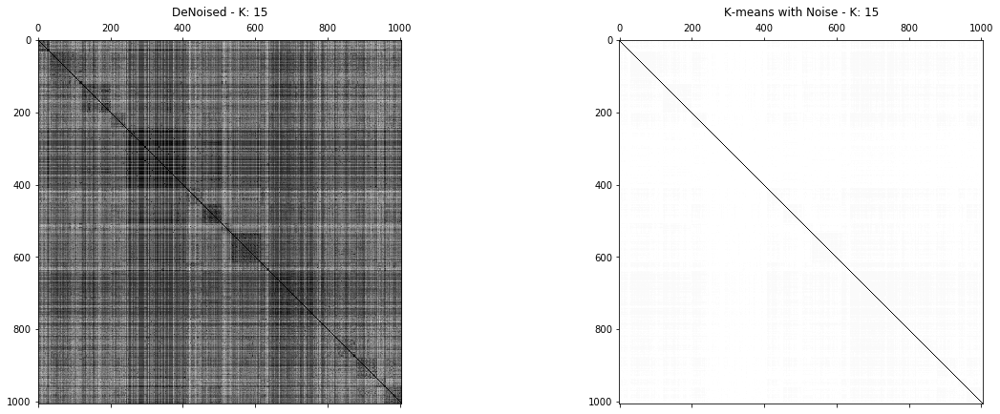

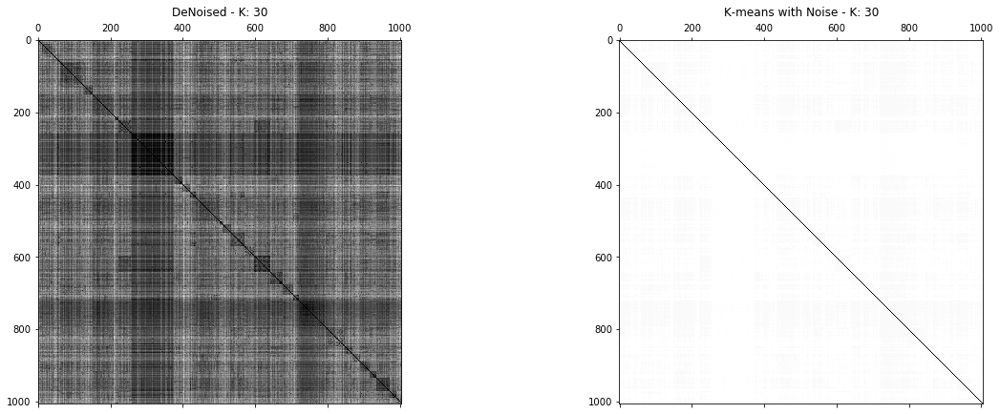

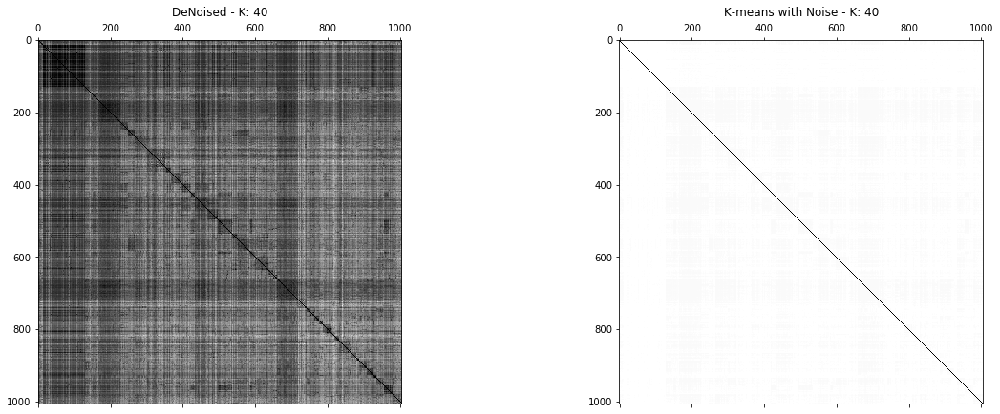

In [11]:
# the embedded vecotrs: also bring noisy part in the right ordering
# ------------------------------------------------------------------------------------------
k_plot = [2,3,5,9,15,30,40]
for c_id in k_plot:
    k = c_id
    Xp_k, DtilK_p = CSE_inverse.get_embedded_vectors(p = p_opt_denom)
    Xt_k, DtilK_t = CSE_inverse.get_embedded_vectors(p = NUM_NODES)

    # apply K-means:
    # ------------------------------------------------------------------------------------------
    Kmeans_p = KMeans(n_clusters = k, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_p.fit(Xp_k)
    Kmeans_t = KMeans(n_clusters = k, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_t.fit(Xt_k)
    p_labels = Kmeans_p.predict(Xp_k)
    t_labels = Kmeans_t.predict(Xt_k)

    # Permute the distances, according to the clusters by kmeans
    # ------------------------------------------------------------------------------------------
    space_k_id_p = []
    space_k_id_t = []

    for i in range(k):
        space_k_id_p.append(np.argwhere(p_labels == i)[:,0])
        space_k_id_t.append(np.argwhere(p_labels == i)[:,0])
    space_k_id_p = np.concatenate(space_k_id_p).flatten()
    space_k_id_t = np.concatenate(space_k_id_t).flatten()
    DtilK_p_order = DtilK_p[space_k_id_p,:]
    DtilK_p_order = DtilK_p_order[:,space_k_id_p]
    DtilK_t_order = DtilK_t[space_k_id_t,:]
    DtilK_t_order = DtilK_t_order[:,space_k_id_t]

    # plotting
    # ------------------------------------------------------------------------------------------
    fig, ax = plt.subplots(1, 2, figsize = (20, 7))
    ax[0].matshow(DtilK_p_order, cmap = "gist_gray")
    ax[0].set_title("DeNoised - K: {}".format(k))
    ax[1].set_title("K-means with Noise - K: {}".format(k))
    ax[1].matshow(DtilK_t_order, cmap = "gist_gray")

**Second with the metric as a derivative of the coinse disimilarity:**
$D_{i,j} = 1 - \frac{G_i^T G_j}{||G_i|| + ||G_j||}$

In the plots below, we can see that this measure performs nice. There are some structures.

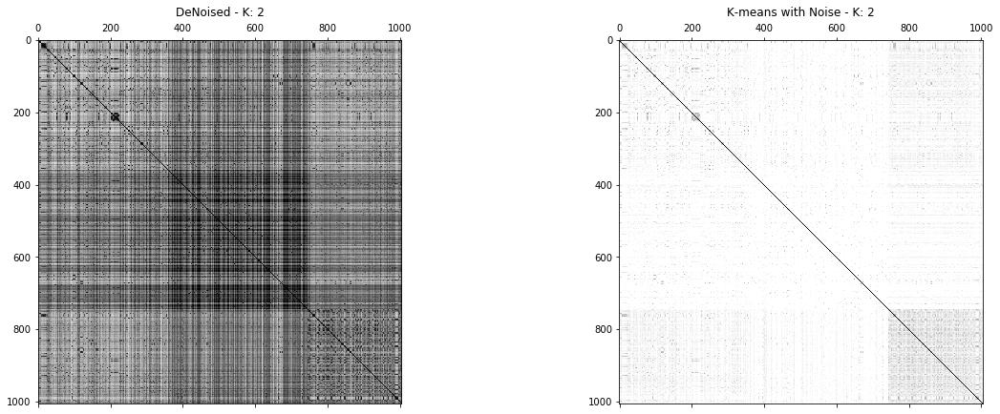

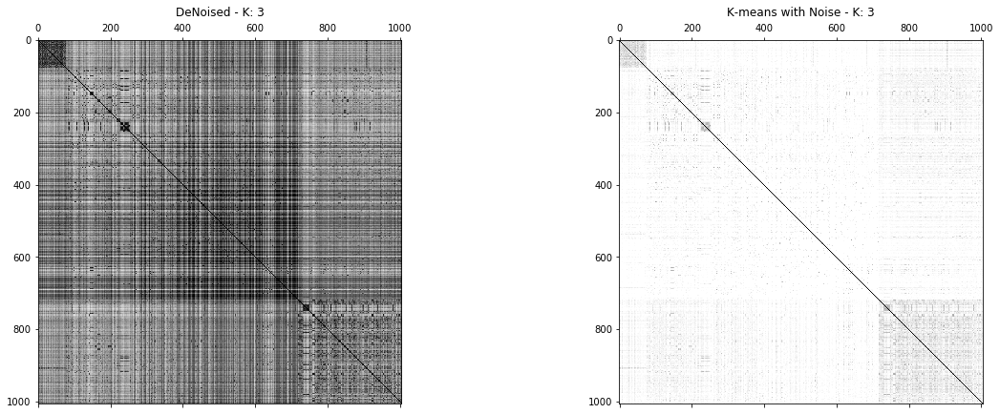

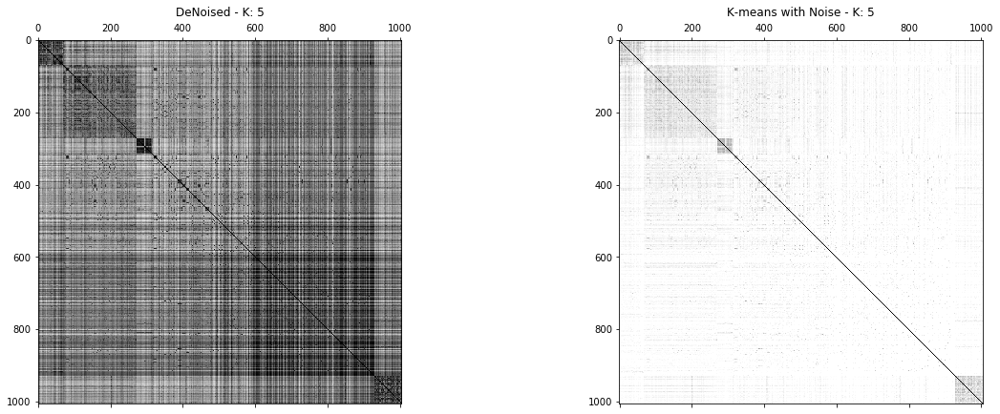

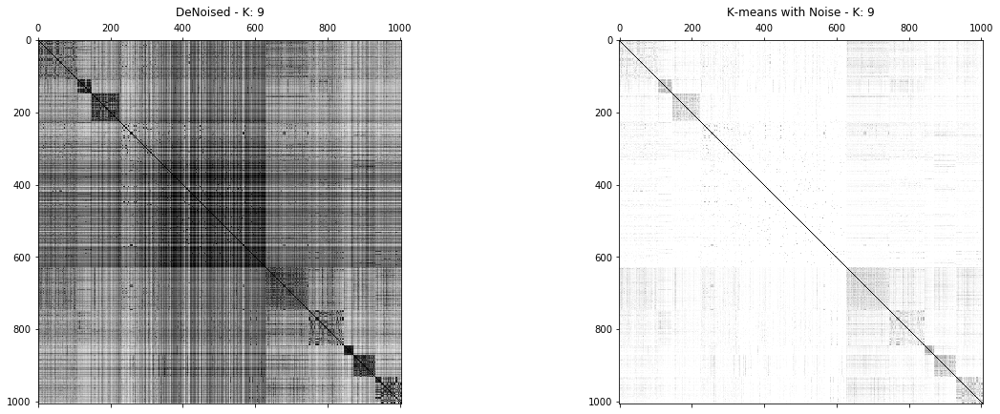

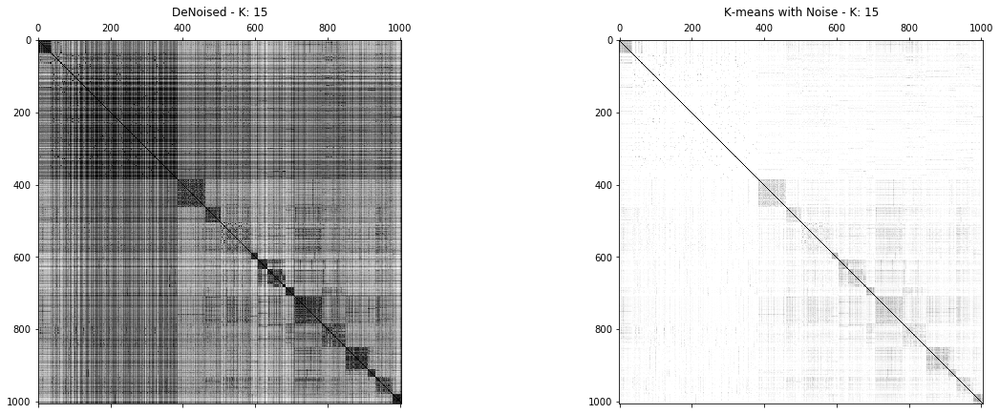

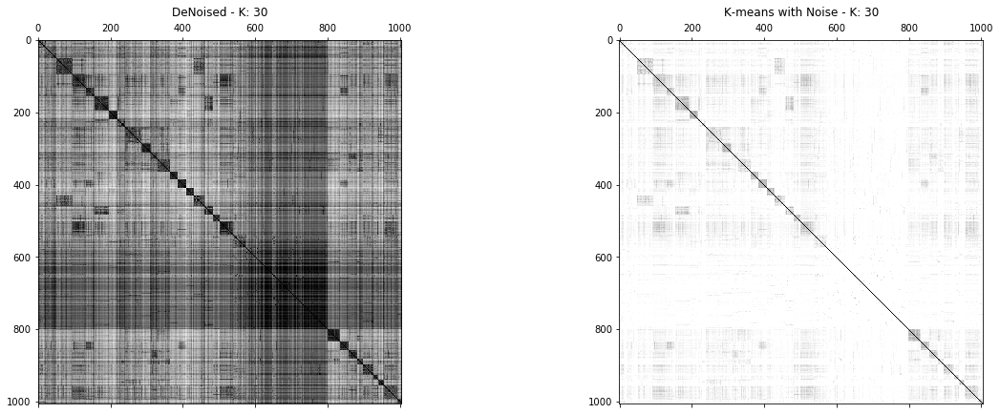

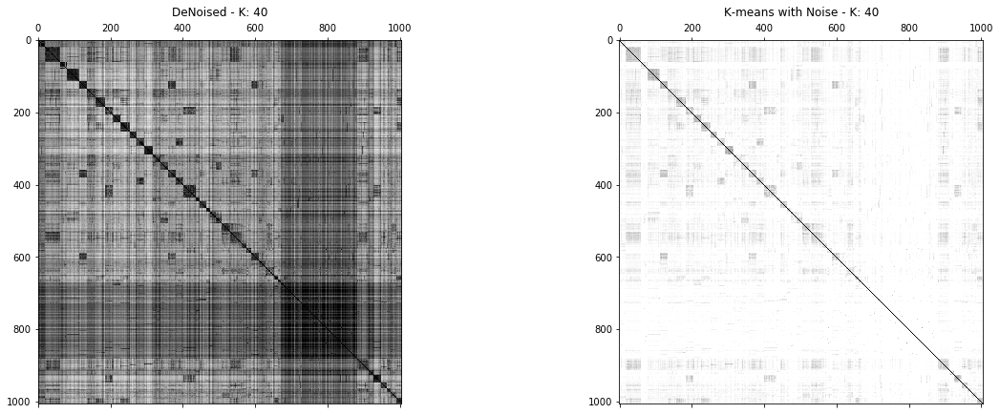

In [12]:
# the embedded vecotrs: also bring noisy part in the right ordering
# ------------------------------------------------------------------------------------------
k_plot = [2,3,5,9,15,30,40]
for c_id in k_plot:
    k = c_id
    Xp_k, DtilK_p = CSE_denom.get_embedded_vectors(p = p_opt_denom)
    Xt_k, DtilK_t = CSE_denom.get_embedded_vectors(p = NUM_NODES)

    # apply K-means:
    # ------------------------------------------------------------------------------------------
    Kmeans_p = KMeans(n_clusters = k, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_p.fit(Xp_k)
    Kmeans_t = KMeans(n_clusters = k, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_t.fit(Xt_k)
    p_labels = Kmeans_p.predict(Xp_k)
    t_labels = Kmeans_t.predict(Xt_k)

    # Permute the distances, according to the clusters by kmeans
    # ------------------------------------------------------------------------------------------
    space_k_id_p = []
    space_k_id_t = []

    for i in range(k):
        space_k_id_p.append(np.argwhere(p_labels == i)[:,0])
        space_k_id_t.append(np.argwhere(p_labels == i)[:,0])
    space_k_id_p = np.concatenate(space_k_id_p).flatten()
    space_k_id_t = np.concatenate(space_k_id_t).flatten()
    DtilK_p_order = DtilK_p[space_k_id_p,:]
    DtilK_p_order = DtilK_p_order[:,space_k_id_p]
    DtilK_t_order = DtilK_t[space_k_id_t,:]
    DtilK_t_order = DtilK_t_order[:,space_k_id_t]

    # plotting
    # ------------------------------------------------------------------------------------------
    fig, ax = plt.subplots(1, 2, figsize = (20, 7))
    ax[0].matshow(DtilK_p_order, cmap = "gist_gray")
    ax[0].set_title("DeNoised - K: {}".format(k))
    ax[1].set_title("K-means with Noise - K: {}".format(k))
    ax[1].matshow(DtilK_t_order, cmap = "gist_gray")

**Cosine Disimilarity:**
$D_{i,j} = 1 - \frac{G_i^T G_j}{\sqrt{||G_i||}  \sqrt{||G_j||}}$ 

We can see below how cosine performs good. There is already some structure in the noisy image, compared to the inverse metric. 

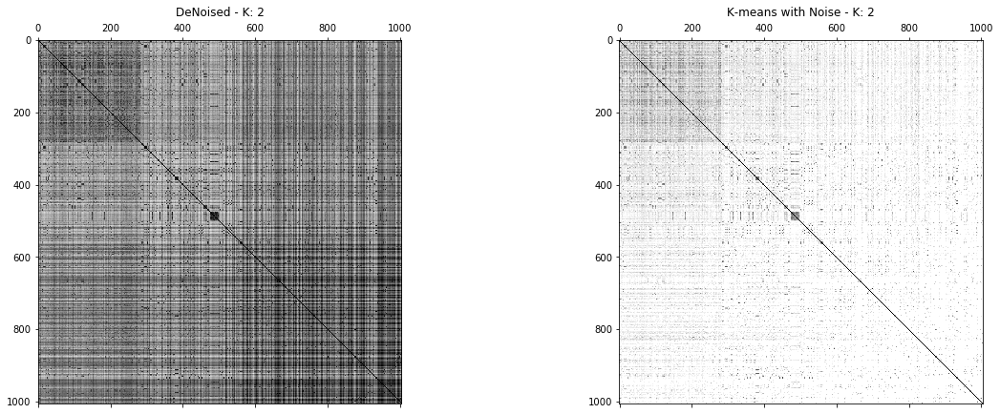

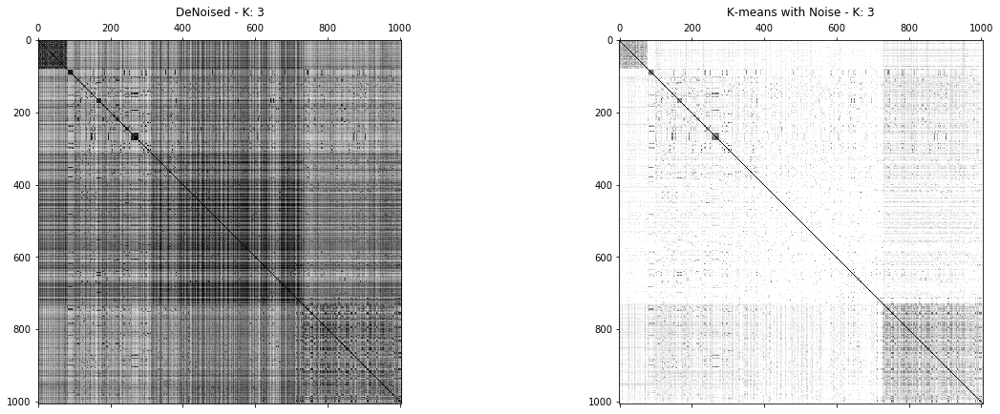

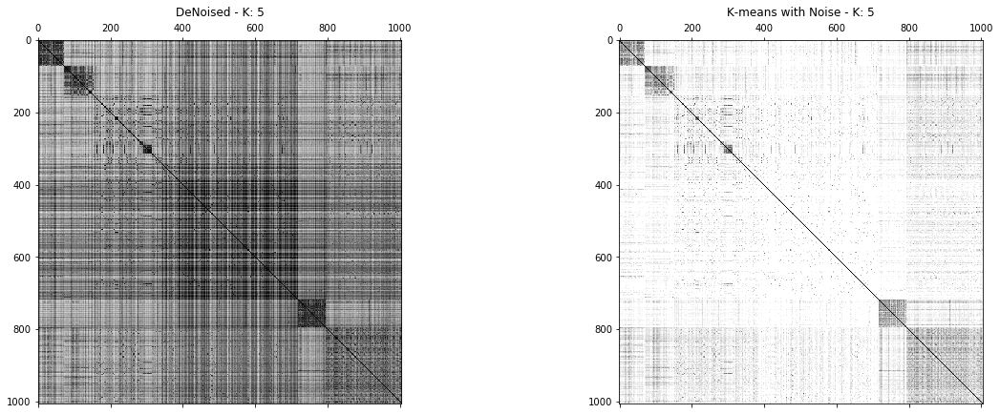

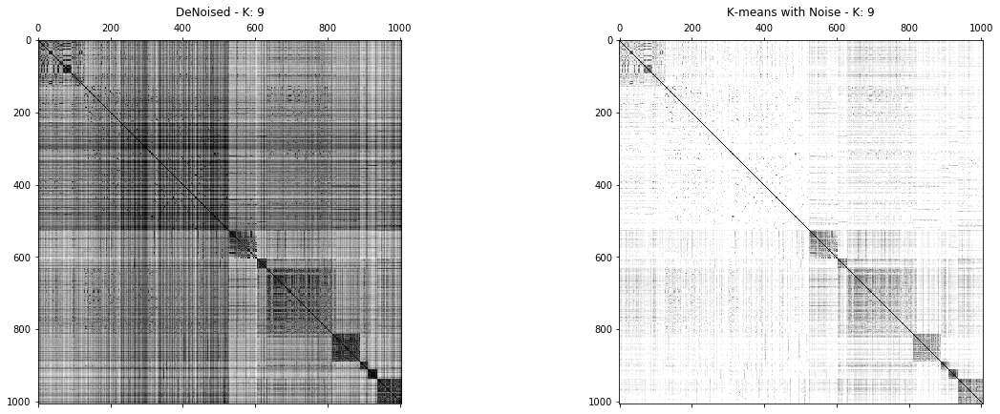

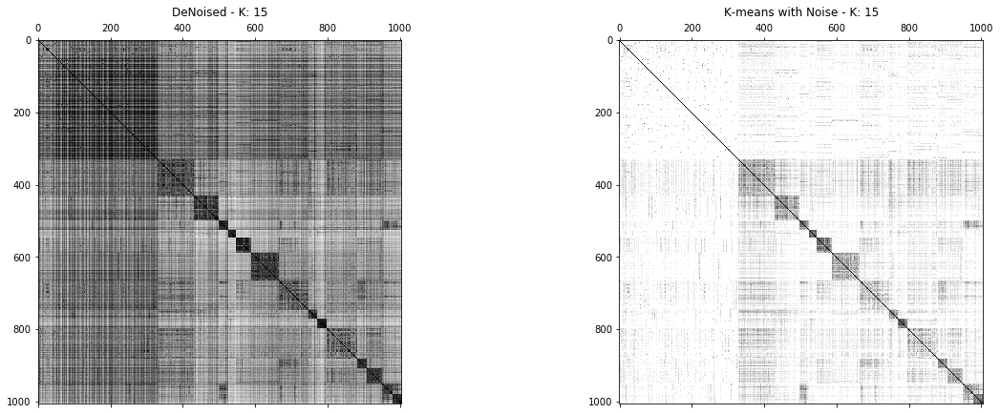

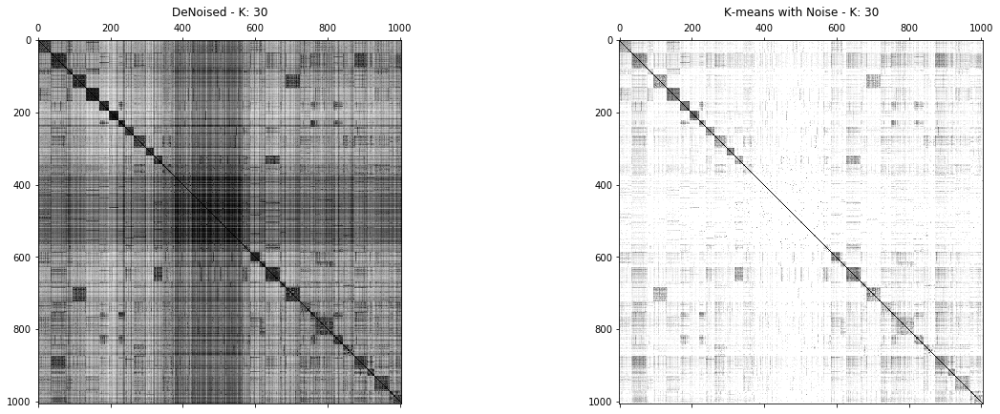

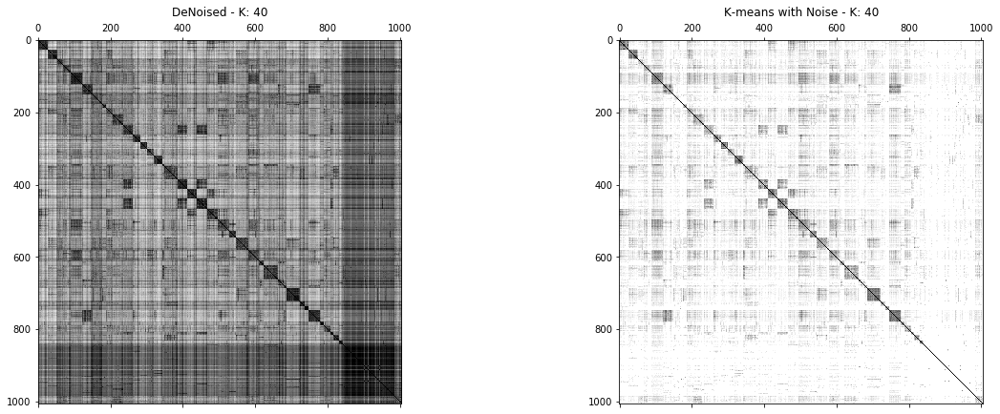

In [13]:
# the embedded vecotrs: also bring noisy part in the right ordering
# ------------------------------------------------------------------------------------------
k_plot = [2,3,5,9,15,30,40]
for c_id in k_plot:
    k = c_id
    Xp_k, DtilK_p = CSE.get_embedded_vectors(p = p_opt_denom)
    Xt_k, DtilK_t = CSE.get_embedded_vectors(p = NUM_NODES)

    # apply K-means:
    # ------------------------------------------------------------------------------------------
    Kmeans_p = KMeans(n_clusters = k, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_p.fit(Xp_k)
    Kmeans_t = KMeans(n_clusters = k, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_t.fit(Xt_k)
    p_labels = Kmeans_p.predict(Xp_k)
    t_labels = Kmeans_t.predict(Xt_k)

    # Permute the distances, according to the clusters by kmeans
    # ------------------------------------------------------------------------------------------
    space_k_id_p = []
    space_k_id_t = []

    for i in range(k):
        space_k_id_p.append(np.argwhere(p_labels == i)[:,0])
        space_k_id_t.append(np.argwhere(p_labels == i)[:,0])
    space_k_id_p = np.concatenate(space_k_id_p).flatten()
    space_k_id_t = np.concatenate(space_k_id_t).flatten()
    DtilK_p_order = DtilK_p[space_k_id_p,:]
    DtilK_p_order = DtilK_p_order[:,space_k_id_p]
    DtilK_t_order = DtilK_t[space_k_id_t,:]
    DtilK_t_order = DtilK_t_order[:,space_k_id_t]

    # plotting
    # ------------------------------------------------------------------------------------------
    fig, ax = plt.subplots(1, 2, figsize = (20, 7))
    ax[0].matshow(DtilK_p_order, cmap = "gist_gray")
    ax[0].set_title("DeNoised - K: {}".format(k))
    ax[1].set_title("K-means with Noise - K: {}".format(k))
    ax[1].matshow(DtilK_t_order, cmap = "gist_gray")

<h2 style="background-color:#f0b375;">
Section 5.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5.5 </span>
</h2>

<p style="background-color:#adebad;">
    Producing 2D and 3D embeddings allows us to nicely visualize generated clusters. Now calculate the embeddings for p = 2 (2D case) and p = 3 (3D case) and plot clusterings for a few values of K.  Alternatively, you could use $p = p^*$ for more gentle denoising, cluster the denoised embeddings and only then apply a dimensionality reduction technique to get a plot in 2,3-dimensional space. You could use PCA, LLE, t-SNE etc. figure out what works for you. As an example see figure 6 (b) from [1] where CSE is combined with PCA.
</p>

I will first try to fit the whole model with p = 2 and p = 3, cluster it and plot it. 
In a second step I will try to fit with $p = p^*$, apply K-means and afterwards try dimension reduction in order to plot it.  

However, I will now work only with the cosine dissimilarity. The other two will be dropped. This because I do not want to make mistakes between all 3 models. Therefore, I only use the model with the cosine dissimmilarity. 


**First Approach:**

In [14]:
## Get embeddings, run K-MEANS and generate plots

First showing how the matrix would look like, as in the above section. But using a smaller range of k values

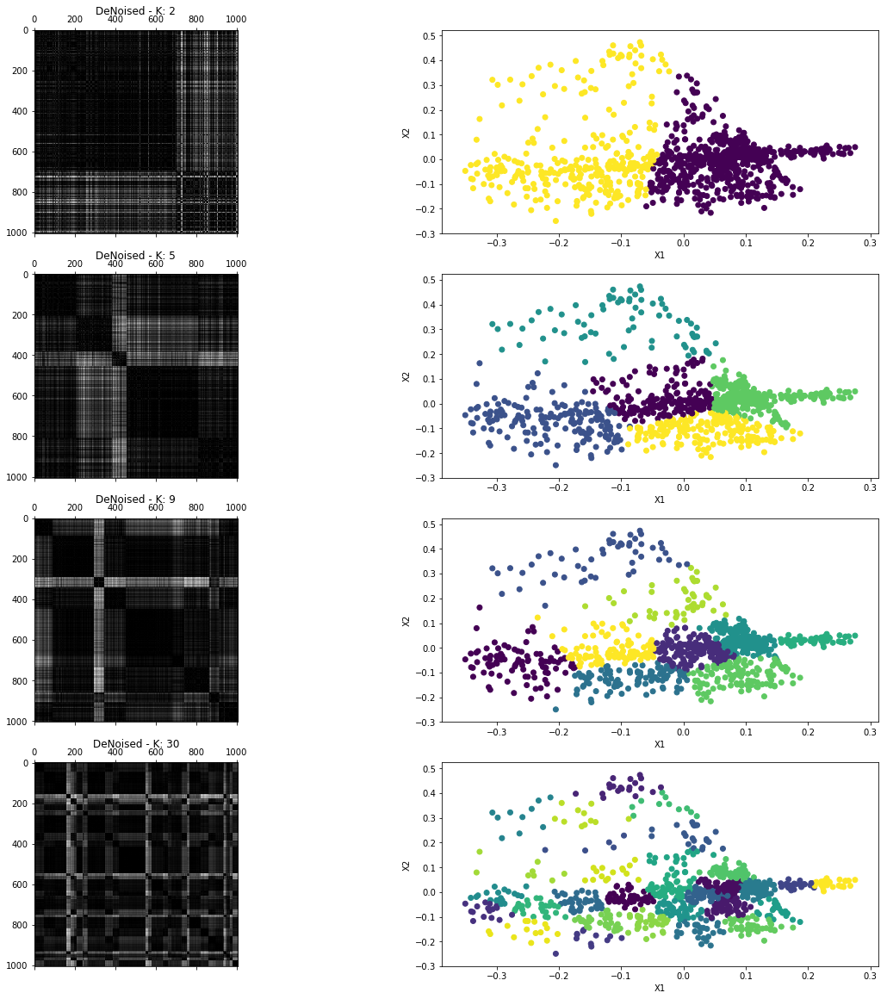

In [15]:
## p = 2
# Get the ebedded vectors for the defined p values: p = 2
# ------------------------------------------------------------------------------------------
Xp, Dp = CSE.get_embedded_vectors(p = 2)
k_iter = [2,5,9,30]

# showing how the matices would look like as above for p = 2
fig, ax = plt.subplots(len(k_iter), 2, figsize = (20, 20))
ax = ax.ravel()
plot_id = 0
for c_id in k_iter:
    
    # apply K-means
    # ------------------------------------------------------------------------------------------
    Kmeans_p = KMeans(n_clusters = c_id, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_p.fit(Xp)
    p_labels = Kmeans_p.predict(Xp)

    # Permute the distances, according to the clusters by kmeans
    # ------------------------------------------------------------------------------------------
    space_k_id_p = []
    for i in range(c_id):
        space_k_id_p.append(np.argwhere(p_labels == i)[:,0])
    space_k_id_p = np.concatenate(space_k_id_p).flatten()
    Dp_order = Dp[space_k_id_p,:]
    Dp_order = Dp_order[:,space_k_id_p]

    # plotting
    # ------------------------------------------------------------------------------------------
    # matrix
    ax[plot_id].matshow(Dp_order, cmap = "gist_gray")
    ax[plot_id].set_title("DeNoised - K: {}".format(c_id))
    
    # 2d plot
    plot_id = plot_id + 1
    ax[plot_id].scatter(Xp[:,0], Xp[:,1], c = p_labels)
    ax[plot_id].set_xlabel("X1")
    ax[plot_id].set_ylabel("X2")
    plot_id = plot_id + 1

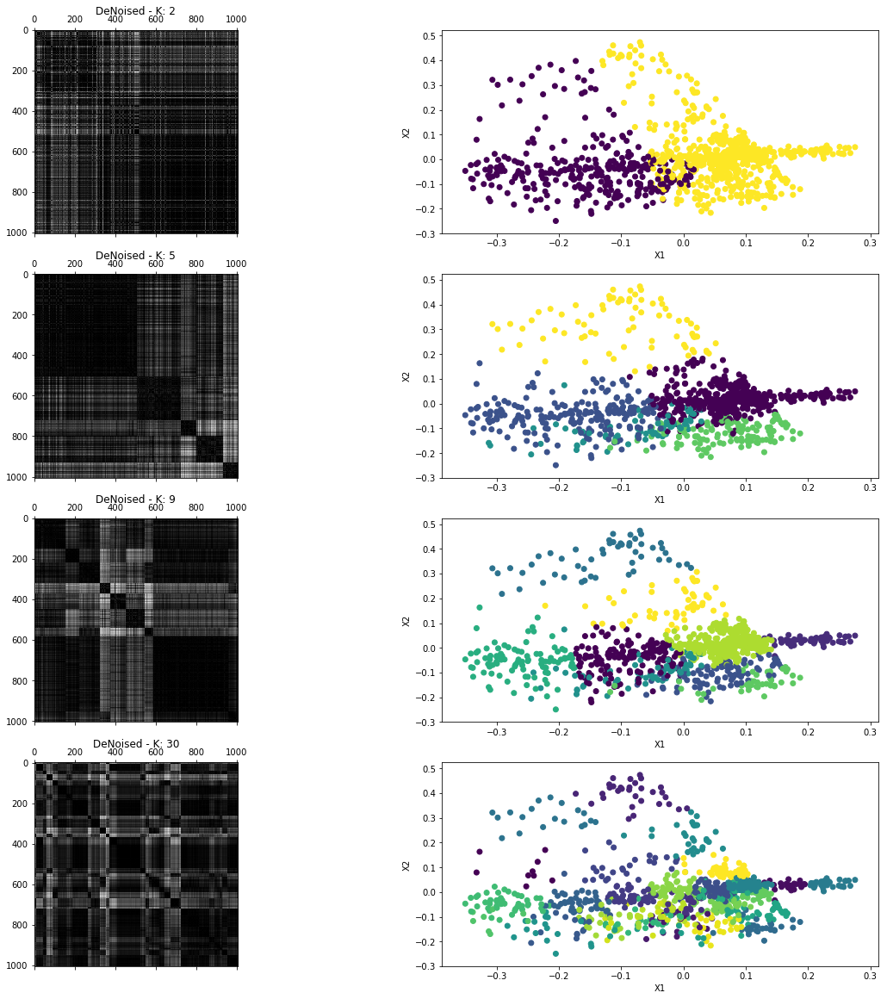

In [16]:
## p = 3
# Get the ebedded vectors for the defined p values: p = 3
# ------------------------------------------------------------------------------------------
Xp, Dp = CSE.get_embedded_vectors(p = 3)
k_iter = [2,5,9,30]

# showing how the matices would look like as above for p = 3
fig, ax = plt.subplots(len(k_iter), 2, figsize = (20, 20))
ax = ax.ravel()
label_k = [[] for i in range(len(k_iter))]
k_id_l = 0
plot_id = 0
for c_id in k_iter:
    
    # apply K-means
    # ------------------------------------------------------------------------------------------
    Kmeans_p = KMeans(n_clusters = c_id, random_state = 777) # hit 777 and the lights go crazy in the casino
    Kmeans_p.fit(Xp)
    p_labels = Kmeans_p.predict(Xp)
    label_k[k_id_l] = p_labels.flatten()
    k_id_l = k_id_l + 1
    # Permute the distances, according to the clusters by kmeans
    # ------------------------------------------------------------------------------------------
    space_k_id_p = []
    for i in range(c_id):
        space_k_id_p.append(np.argwhere(p_labels == i)[:,0])
    space_k_id_p = np.concatenate(space_k_id_p).flatten()
    Dp_order = Dp[space_k_id_p,:]
    Dp_order = Dp_order[:,space_k_id_p]

    # plotting
    # ------------------------------------------------------------------------------------------
    # matrix
    ax[plot_id].matshow(Dp_order, cmap = "gist_gray")
    ax[plot_id].set_title("DeNoised - K: {}".format(c_id))
    
    # 2d plot
    plot_id = plot_id + 1
    ax[plot_id].scatter(Xp[:,0], Xp[:,1], c = p_labels)
    ax[plot_id].set_xlabel("X1")
    ax[plot_id].set_ylabel("X2")
    plot_id = plot_id + 1



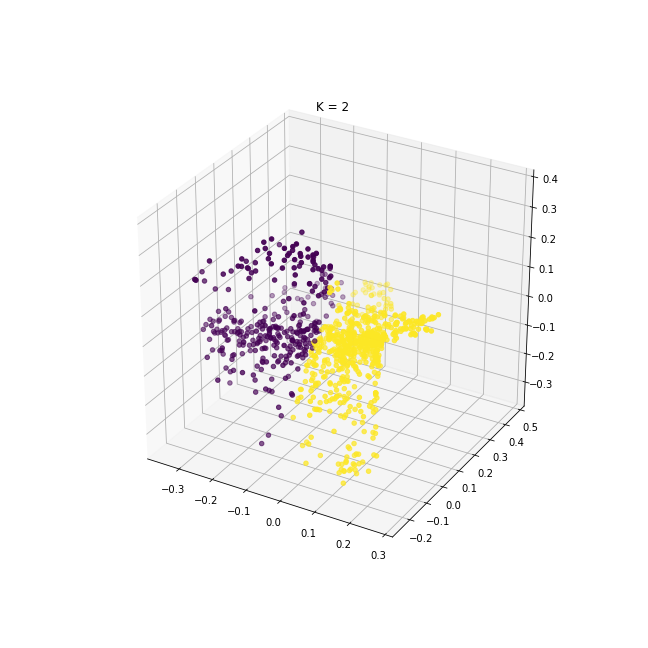

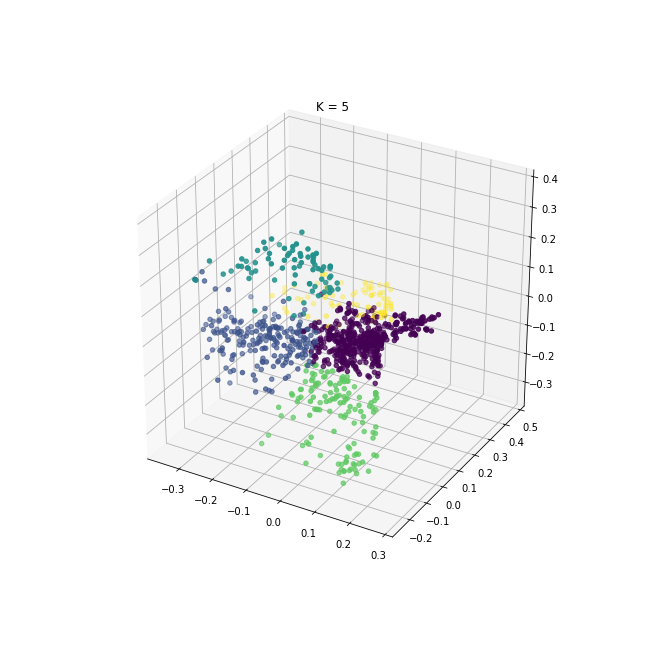

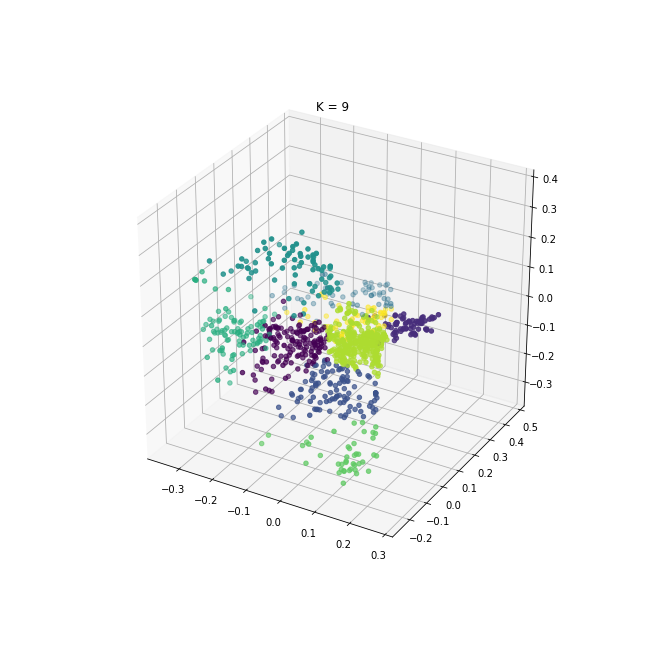

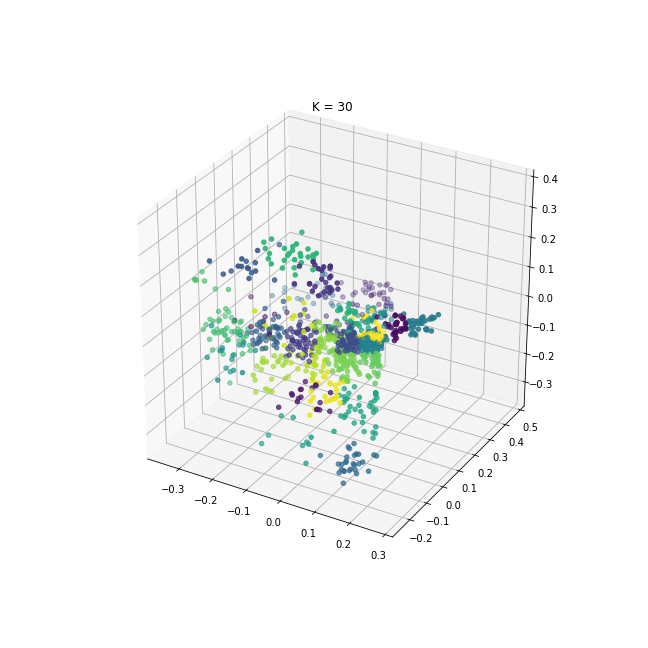

In [17]:
# 3d plot
%config InlineBackend.print_figure_kwargs = {'bbox_inches':None}

for k_idx in range(len(k_iter)):
    fig= plt.figure(figsize=(9,9))
    ax3d = fig.gca( projection = "3d")
    ax3d.scatter(Xp[:,0], Xp[:,1], Xp[:,2], c = label_k[k_idx])
    ax3d.set_title("K = {}".format(k_iter[k_idx]))
    

**PCA:**

Text(0, 0.5, 'Ratio - Variance')

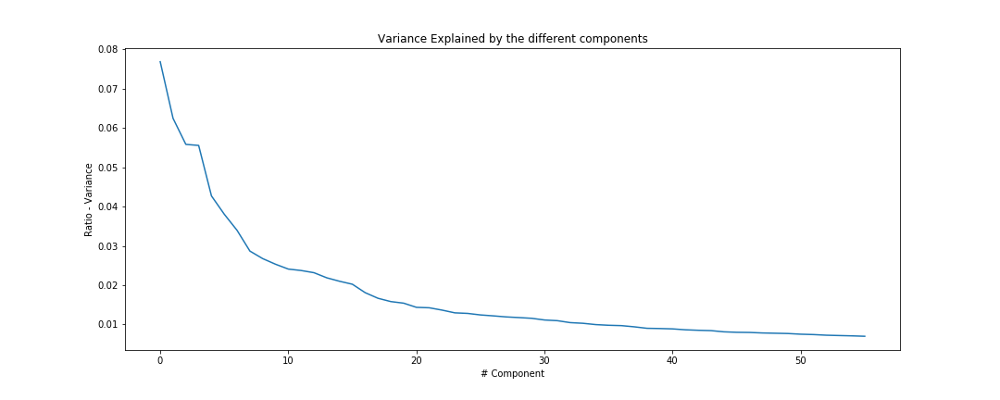

In [18]:
## choose p > 3, for example, p = p_opt, to compute CSE embeddings 
## First, cluster the computed p-dimentional embeddings and then project them onto 2-dimensional space 
## for visualization using PCA, LL, t-SNE or something else
%matplotlib inline
'''
However, now we have more than 50 "coordinattes: 

            1) I will do Kmeans
            2) after Kmeans one has to push the reduce dimensionality.
            3) plot clusters with reduced dimensionaltiy
            
'''
# produce the p_opt embedding.
# ------------------------------------------------------------------------------------------
# 1) KMeans with p = popt
Xpopt, Dpopt = CSE.get_embedded_vectors(p = p_opt)

# 2) Reduce dimensionality: PCA --> into 2 dimensions
pca_popt = PCA()
pca_popt.fit(Xpopt)
fig = plt.figure(figsize = (15, 6))
plt.plot(pca_popt.explained_variance_ratio_)
plt.title("Variance Explained by the different components")
plt.xlabel("# Component")
plt.ylabel("Ratio - Variance")

However, considering the first 2 components, they explain together 15% of the variance. Therefore I do not expect, to see a very nice splitting behaviour in the comming plots.

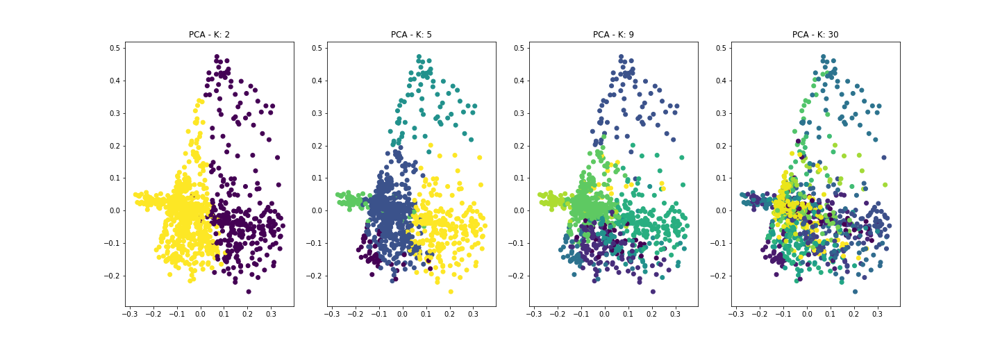

In [19]:
k_iter = [2,5,9,30]
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(Xpopt)
fig, axs = plt.subplots(1, len(k_iter), figsize = (20,7))
axs = axs.ravel()
for k_id in range(len(k_iter)):
    Kmeans = KMeans(n_clusters = k_iter[k_id], random_state=777)
    Kmeans.fit(Xpopt)
    p_labels = Kmeans.predict(Xpopt)
    axs[k_id].scatter(principalComponents[:,0], principalComponents[:,1], c = p_labels)
    axs[k_id].set_title("PCA - K: {}".format(k_iter[k_id]))

The picture in the beginning is very similar to the above, where we done first PCA and afterwards clustering. However, there is more overlapping when we first use k-means on larger p and afterwards reduce dimensions. With more clusters, we can see how it behaves compared to above.

**t-SNE:**

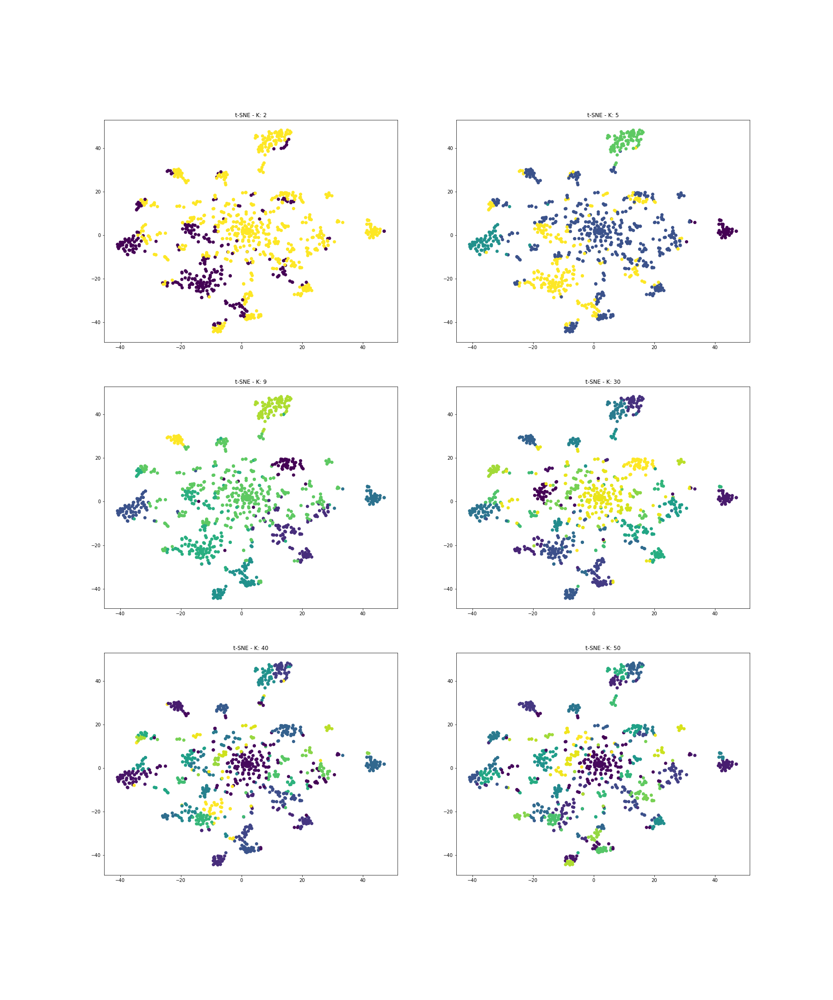

In [20]:
k_iter = [2,5,9,30,40,50]
Xpopt, Dpopt = CSE.get_embedded_vectors(p = p_opt)
X_embedded = TSNE(n_components=2, random_state = 777).fit_transform(Xpopt)
fig, axs = plt.subplots(3, 2, figsize = (25,30))
axs = axs.ravel()
label_k = [[]for i in range(len(k_iter))]
for k_id in range(len(k_iter)):
    Kmeans = KMeans(n_clusters = k_iter[k_id], random_state=777)
    Kmeans.fit(Xpopt)
    p_labels = Kmeans.predict(Xpopt)
    label_k[k_id] = p_labels
    axs[k_id].scatter(X_embedded[:,0], X_embedded[:,1], c = p_labels)
    axs[k_id].set_title("t-SNE - K: {}".format(k_iter[k_id]))

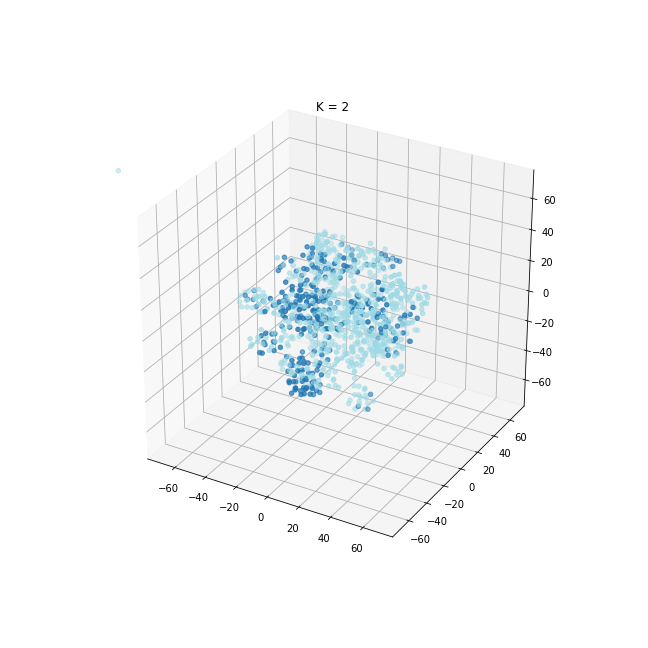

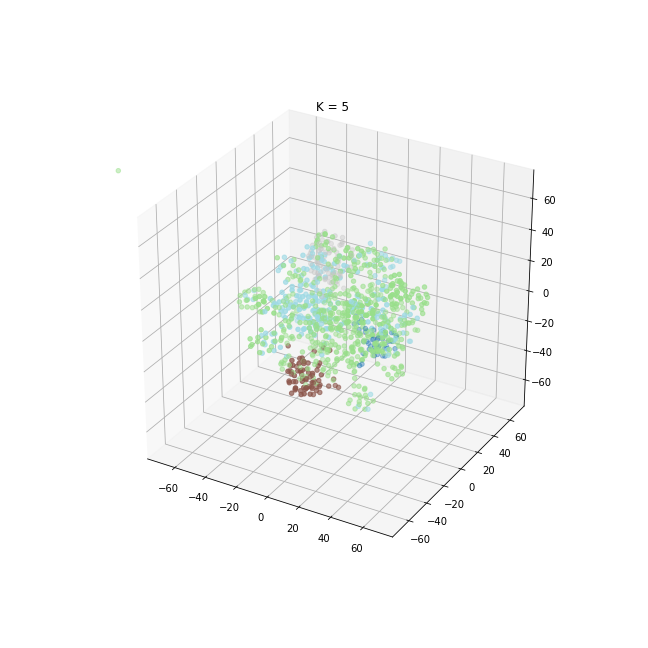

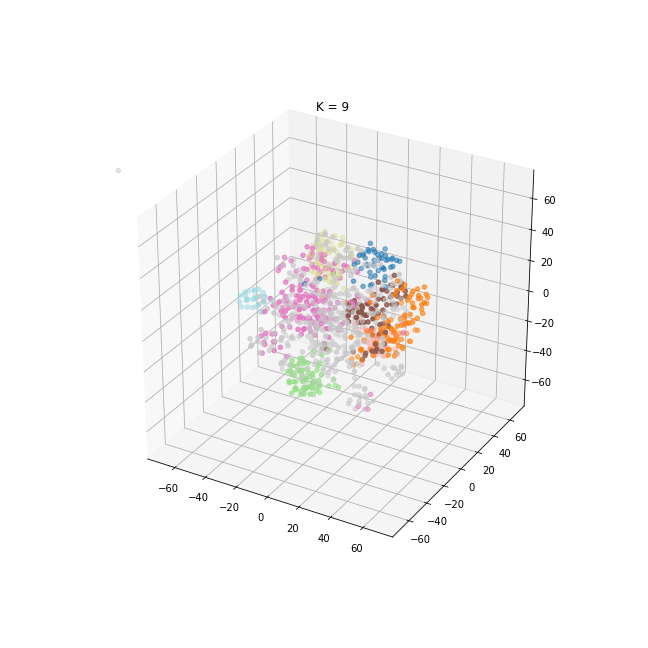

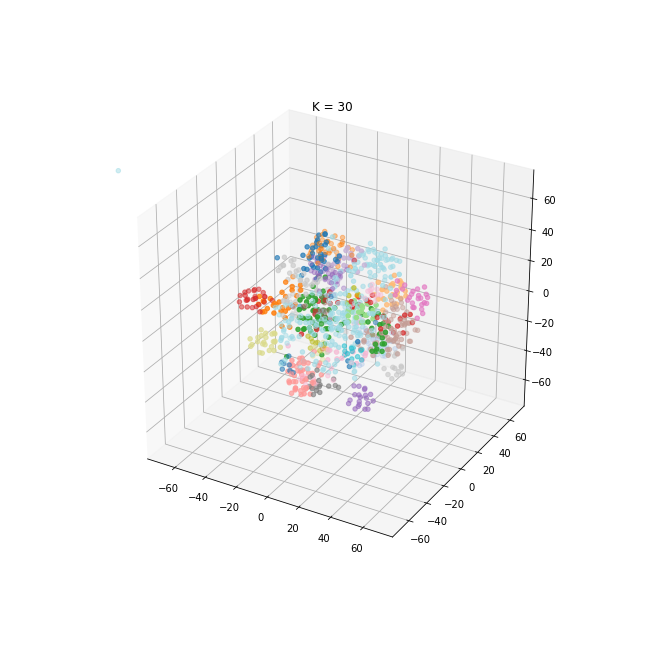

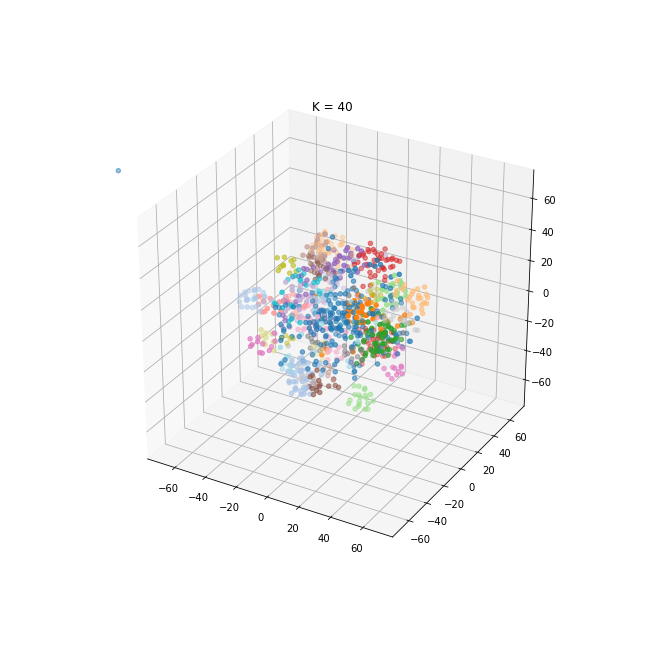

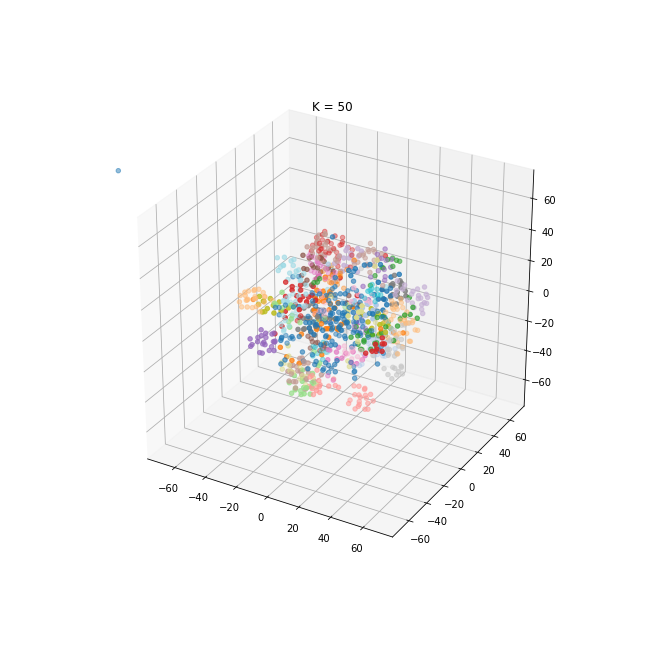

In [21]:
# 3d plot
%config InlineBackend.print_figure_kwargs = {'bbox_inches':None}
%matplotlib inline
Xpopt, Dpopt = CSE.get_embedded_vectors(p = p_opt)
X_embedded = TSNE(n_components=3, random_state = 17).fit_transform(Xpopt)
for k_idx in range(len(k_iter)):
    fig= plt.figure(figsize=(9,9))
    ax3d = fig.gca( projection = "3d")
    ax3d.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], c = label_k[k_idx], cmap = "tab20")
    ax3d.set_title("K = {}".format(k_iter[k_idx]))
    ax3d.set_xlim(-75, 75)
    ax3d.set_ylim(-75,75)
    ax3d.set_zlim(-75,75)

<h2 style="background-color:#f0b375;">
Section 6.0 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 6.0 </span>
</h2>

<p style="background-color:#adebad;">
Finally, to evaluate the quality of the above derived clusters, let's compare our predictions with the ground truth. We will use the actual member-institution mappings given in [2]. You can reuse code from the previous coding exercises to align the cluster labels with the ground truth.
</p>

In [22]:
# Initialize community members affeliation array
AFFILIATIONS = np.zeros((NUM_NODES, ))

# Fill out the affiliation array
with open("email-Eu-core-department-labels.txt") as file:
    for line in file:
        pair = [int(x) for x in line.split()]
        AFFILIATIONS[pair[0]] = pair[1]

# Number of organizations is 
print("The true number of clusters (departments) is: ",len(np.unique(AFFILIATIONS)))

The true number of clusters (departments) is:  42


<p style="background-color:#adebad;">
Visually or quantitatively, in a clever and convincing way, show that the K-MEANS generated clusters overlap with the ground truth clusters (member affiliations). How can we measure the overlapping of the predicted and true clusters?
</p>

Ways to measure overlapping:

    1) Accuracy
    2) Confusion Matrix
    3) plot original labels with embedded X next to predicted labels on same embedded X


In [23]:
def change_lab(label, prediction):
    label = label.flatten()
    prediction = prediction.flatten()
    space = np.zeros((len(np.unique(label)), len(np.unique(prediction))))
    for l in range(len(np.unique(label))):
        for p in range(len(np.unique(prediction))):
            l_pid = np.argwhere(label == l)
            p_pid = np.argwhere(prediction == p)
            count = int(np.sum(np.isin(l_pid, p_pid)))
            space[l, p] = count
    cm = l_s_a(-space)
    change = np.zeros_like(prediction)
    for i in range(len(cm[0])):
        change[np.argwhere(prediction == cm[1][i])] = cm[0][i]
    return change

Text(0.5, 1.0, 'True: t-SNE - K: 42')

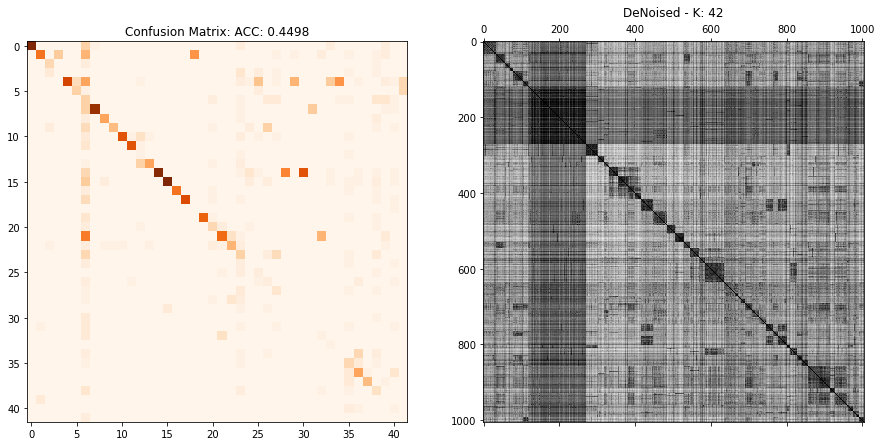

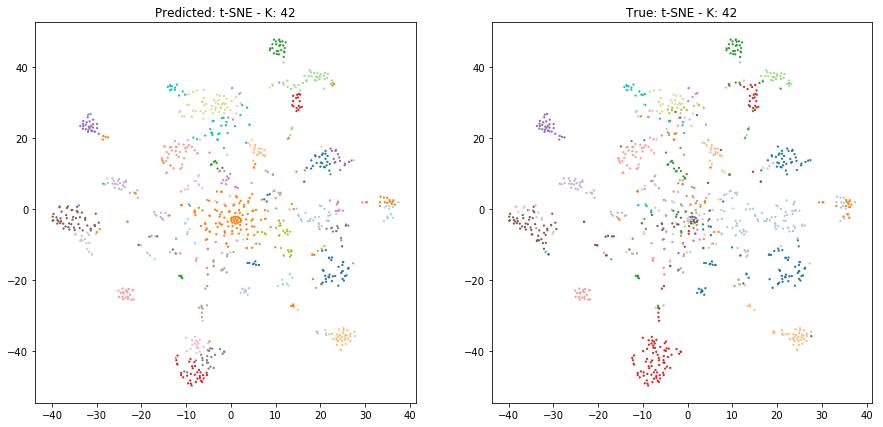

In [24]:
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {'bbox_inches':'tight'}
# Way to go: First compute the embedded vectors with p = p_opt
# then use them on K_means with n_components. 
# Apply Hungarian Algorithm to match labels of the true and the predicted. 
# plot Confusion matrix etc...
# ------------------------------------------------------------------------------------------

# 1) get the embedded vectors once again:
# ------------------------------------------------------------------------------------------
Xpopt, Dpopt = CSE.get_embedded_vectors(p = p_opt)

# 2) Kmenas with n_clusters = 42. 
# ------------------------------------------------------------------------------------------
KM_last = KMeans(n_clusters = 42, random_state = 777)
KM_last.fit(Xpopt)
p_labels = KM_last.predict(Xpopt).flatten().astype(np.int32)

# 3) Match labels with Hungarian Algorithm:
# ------------------------------------------------------------------------------------------
t_labels = AFFILIATIONS.flatten().astype(np.int32)
p_labels = change_lab(t_labels, p_labels)

# 4) plotting of the confusion matrix. (42 x 42)
# ------------------------------------------------------------------------------------------
conf_mat = confusion_matrix(t_labels, p_labels)
space_k_id_p = []
for i in range(42):
    space_k_id_p.append(np.argwhere(p_labels == i)[:,0])
space_k_id_p = np.concatenate(space_k_id_p).flatten()
Dp_order = Dpopt[space_k_id_p,:]
Dp_order = Dp_order[:,space_k_id_p]

fig, ax = plt.subplots(1, 2, figsize = (15,15))
ax[0].imshow(conf_mat, cmap="Oranges")
ax[0].set_title("Confusion Matrix: ACC: {}".format(np.round(np.sum(np.diag(conf_mat))/np.sum(conf_mat), 4)))

# matrix - plotting
# ------------------------------------------------------------------------------------------
# matrix
ax[1].matshow(Dp_order, cmap = "gist_gray")
ax[1].set_title("DeNoised - K: {}".format(42))

# 5) plot of the groups:
# ------------------------------------------------------------------------------------------
X_embedded = TSNE(n_components=2, random_state = 17).fit_transform(Xpopt)
fig, axs = plt.subplots(1, 2, figsize=(15,7))
axs = axs.ravel()
axs[0].scatter(X_embedded[:,0], X_embedded[:,1], c = p_labels, s = 1.5, cmap = "tab20")
axs[0].set_title("Predicted: t-SNE - K: {}".format(42))
axs[1].scatter(X_embedded[:,0], X_embedded[:,1], c = t_labels, s = 1.5, cmap = "tab20")
axs[1].set_title("True: t-SNE - K: {}".format(42))

Text(0.5, 0.92, 'True - K = 42')

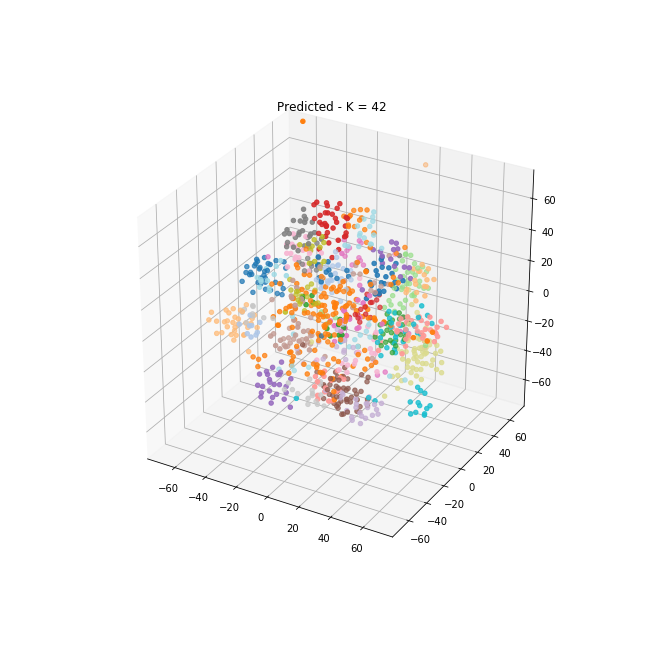

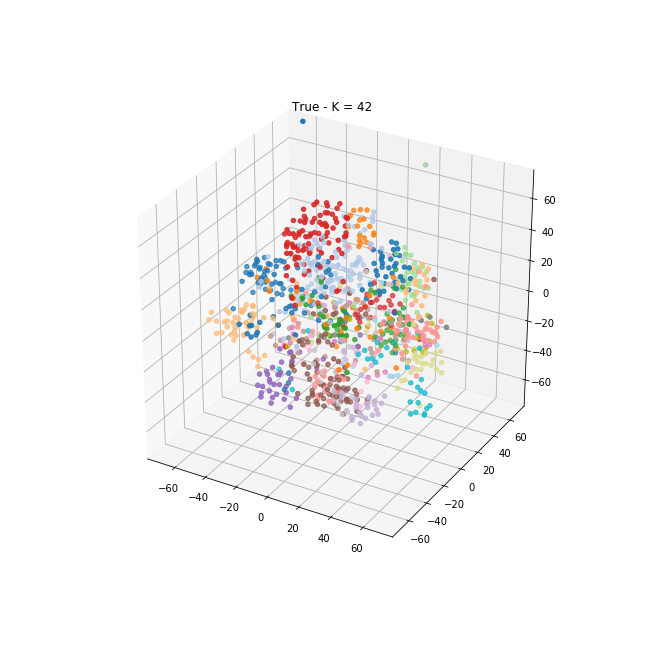

In [25]:
X_embedded = TSNE(n_components=3, random_state = 4).fit_transform(Xpopt)
%config InlineBackend.print_figure_kwargs = {'bbox_inches':None}

# predicted labels in 3d
fig= plt.figure(figsize=(9,9))
ax3d = fig.gca( projection = "3d")
ax3d.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], c = p_labels, cmap = "tab20")
ax3d.set_xlim(-75, 75)
ax3d.set_ylim(-75,75)
ax3d.set_zlim(-75,75)
ax3d.set_title("Predicted - K = {}".format(42))

# true labels in 3d
fig= plt.figure(figsize=(9,9))
ax3d = fig.gca( projection = "3d")
ax3d.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], c = t_labels, cmap = "tab20")
ax3d.set_xlim(-75, 75)
ax3d.set_ylim(-75,75)
ax3d.set_zlim(-75,75)
ax3d.set_title("True - K = {}".format(42))           

**Please, write here your explanations, observation and thoughts about results of the experiments above.**
 
We can see that the accuracy of the prediction is about 44\%. This is not that much as expected, however, it is an overlap of 44\%. We can also see, that the plots including colors for all groups, have the same color label for the ground truth and the predicted, which is also an indicator for overlapping.
However, one reason for the little accuracy might be the fact, that I used the hungarian algorithm to match the labels of the ground truth and predictions. This will then result in 42 color labels in the predicted. However, This does not have to be the right way of matching for such a problem. If one would use some matching like: just assigning to the maximum overlap in truth and predicted labels, one might have a better performance, measured as accuracy. But one would go with the risk, that then, one would not have some group label in the predicted case. 

However, with the hungarian algorithm matching, we see i.e. in the 3d plots, that some clusters are quite good predicted. If one looks at the lower part of the boxes, we see that the purpel, brown light purple and light blue is identified good. Also going from the right botton corner upwards, we see quite good performance. By quite good I understand it is subjective, but there is some nice overlap. 

## Comments

We hope you found this exercise instructive.

Feel free to leave comments below, we will read them carefully.

Was a nice exercise and helped me to understand how to work with higher dimensional data, and its representation. However, as a feed back I would recommend, to include something like the link to 
https://stackoverflow.com/questions/26714626/how-to-disable-bbox-inches-tight-when-working-with-matplotlib-inline-in-ipytho
As it would have saved me alot of time, in order to make pictures small or large in 3d using jupyter.